In [ ]:
!unzip /content/drive/MyDrive/YOLOv5_SmallOD_Person/YOLOv5_SmallOD_Person.zip

In [2]:
!pip install utils

In [3]:
!pip install albumentations==0.4.6

     |████████████████████████████████| 117 kB 12.7 MB/s 
     |████████████████████████████████| 948 kB 46.3 MB/s 
  Created wheel for albumentations: filename=albumentations-0.4.6-py3-none-any.whl size=65174 sha256=b45c3561ad4e1efb30a6d63e5f1c94b4c80a2cb659cbd0b3df835da051e02061
  Stored in directory: /root/.cache/pip/wheels/cf/34/0f/cb2a5f93561a181a4bcc84847ad6aaceea8b5a3127469616cc
Successfully built albumentations
  Attempting uninstall: imgaug
    Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [4]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import utils

# for image augmentations
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2


In [5]:

class SmallObjectDataset(torch.utils.data.Dataset):
  def __init__(self, files_dir, annos_dir, width, height, transforms=None):
    self.transforms = transforms
    self.files_dir = files_dir
    self.annos_dir = annos_dir
    self.height = height
    self.width = width

    self.classes = [_, "Object"]
    self.images = os.listdir(self.files_dir)

  def __getitem__(self, idx):
    image_name = self.images[idx]
    image_path = os.path.join(self.files_dir, image_name)

    image = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    img_res = cv2.resize(img_rgb, (self.width, self.height), cv2.INTER_AREA)
    img_res /= 255.0

    #Annotation file
    anno_filename = image_name.split(".jpg")[0] + ".txt"
    anno_file_path = os.path.join(self.annos_dir, anno_filename)


    boxes = []
    labels = []

    wt = image.shape[1]
    ht = image.shape[0]

    with open(anno_file_path, "rb") as file:
      content = file.readlines()
      
    for item in content:
      row = str(item).replace("b'","")
      row = row.replace("\\r\\n'", "")

      # label = float(row.split(" ")[0])
      label = float(1)
      labels.append(label)

      # x_center = float(row.split(" ")[1])
      # y_center = float(row.split(" ")[2])
      # width = float(row.split(" ")[3])
      # height = float(row.split(" ")[4])
      # boxes.append([x_center, y_center, width, height])

      x_center = float(row.split(" ")[1])*self.width
      y_center = float(row.split(" ")[2])*self.height
      width = float(row.split(" ")[3])*self.width
      height = float(row.split(" ")[4])*self.height

      x_min = x_center - width/2
      y_min = y_center - height/2
      x_max = x_center + width/2
      y_max = y_center + height/2
      if x_min < 0:
        x_min = 0
      if y_min < 0:
        y_min = 0
      if x_max > self.width:
        x_max = self.width
      if y_max > self.height:
        y_max = self.height
      boxes.append([x_min, y_min, x_max, y_max])

    #convert boxes into a torch.Tensor
    boxes = torch.as_tensor(boxes, dtype=torch.float32)
    # print(boxes)
    #Getting the ares of the boxes
    area = (boxes[:,2] - boxes[:,0]) * (boxes[:,3] - boxes[:,1])


    #Suppose all instances are not crowd
    iscrowd = torch.zeros((boxes.shape[0],),dtype=torch.int64)
    labels = torch.as_tensor(labels, dtype=torch.int64)

    target = {}
    target["boxes"] = boxes
    target["labels"] = labels
    target["area"] = area
    target["iscrowd"] = iscrowd

    #Image_id
    image_id = torch.tensor([idx])
    target["image_id"] = image_id

    if self.transforms:
      sample = self.transforms(image=img_res,
                               bboxes = target["boxes"],
                               labels = labels)
      img_res = sample["image"]
      target["boxes"] = torch.Tensor(sample["bboxes"])

    return img_res, target

  def __len__(self):
    return len(self.images)




In [6]:
files_dir = "/content/YOLOv5_SmallOD_Person/PART_1/datasets/images"
annos_dir =  "/content/YOLOv5_SmallOD_Person/PART_1/datasets/labels"
dataset = SmallObjectDataset(files_dir=files_dir, annos_dir=annos_dir, 
                             width=1280, height=1280, transforms=None)


img_test, target_test = dataset[0]
print(img_test.shape, target_test)
print("Length dataset: ", len(dataset))

(1280, 1280, 3) {'boxes': tensor([[ 546.8235,  904.3660,  613.6470, 1048.2615],
        [ 435.7647,  683.9216,  485.6471,  788.4967]]), 'labels': tensor([1, 1]), 'area': tensor([9615.5957, 5216.4541]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([0])}
Length dataset:  2912


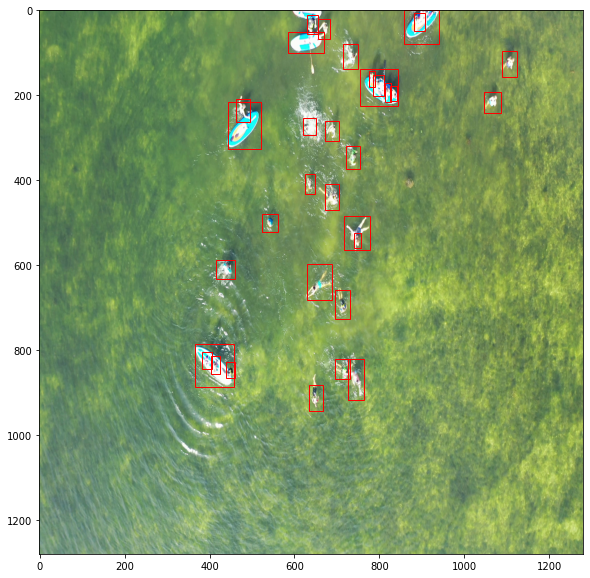

In [ ]:
def plot_bbox(img, target):
  fig, a = plt.subplots(1,1)
  fig.set_size_inches(10,10)
  a.imshow(img)
  for box in target["boxes"]:
    x_min = box[0]
    y_min = box[1]
    width = box[2] - box[0]
    height = box[3] - box[1]
    rectangle = patches.Rectangle((x_min,y_min), width, height,
                                  edgecolor="r", facecolor="none")
    a.add_patch(rectangle)
  plt.show()

img_test, target_test = dataset[10]
plot_bbox(img_test, target_test)
    



In [7]:
#Get_model
def get_model(num_classes):
  #Load a pretrained model on COCO dataset
  model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

  #Get number of input features for the classifier
  in_features = model.roi_heads.box_predictor.cls_score.in_features
  # print(in_features)

  #Replace the pre-trained head with a new one
  model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
  return model

model = get_model(2)
print(model)


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [8]:
#Augmentations for bounding box
def get_transforms(train):
  if train:
    return A.Compose([A.HorizontalFlip(0.5),
                      ToTensorV2(p=0.1)],
                      bbox_params={'format':'pascal_voc',
                                   'label_fields':['labels']})
  else:   #For val/test
    return A.Compose([ToTensorV2(p=0.1)],
                     bbox_params={'format':'pascal_voc',
                                  'label_fields':['labels']})

def collate_fn(batch):
  return tuple(zip(*batch))
    

In [9]:
#Preparing dataset
files_dir = "/content/YOLOv5_SmallOD_Person/PART_1/datasets/images"
annos_dir =  "/content/YOLOv5_SmallOD_Person/PART_1/datasets/labels"
dataset = SmallObjectDataset(files_dir=files_dir, annos_dir=annos_dir,
                             width=1280, height=1280, transforms=get_transforms(train=True))
dataset_test = SmallObjectDataset(files_dir=files_dir, annos_dir=annos_dir,
                             width=1280, height=1280, transforms=get_transforms(train=False))

#Split the dataset in train and test
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()
# print(indices)

test_split = 0.1
test_size = int(len(dataset)*test_split)

dataset = torch.utils.data.Subset(dataset, indices[:-test_size])
print(len(dataset))
dataset_test = torch.utils.data.Subset(dataset_test, indices[-test_size:])

#Define training and validation dataloader 
data_loader = torch.utils.data.DataLoader(dataset, batch_size=8,
                                          shuffle=True, num_workers=2,
                                          collate_fn=collate_fn)
data_loader_test = torch.utils.data.DataLoader(dataset_test, batch_size=8,
                                               shuffle=False, num_workers=2,
                                               collate_fn=collate_fn)


2621


In [10]:
#Training
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
num_classes = 2
#Get model
model = get_model(num_classes).to(device)

#Construc an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)

#Learning rate scheduler, decreases the learning rate by 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

In [11]:
def data_to_device(images, targets, device=torch.device("cuda")):
  images = list(image.to(device) for image in images)
  targets = [{k:v.to(device) for k,v in t.items()} for t in targets]
  return images, targets

In [ ]:
#Start training
iters = 1
num_epochs = 100
min_loss = 0.0

for epoch in range(num_epochs):
  running_loss = 0.0
  for images, targets in data_loader:
    images, targets = data_to_device(images, targets)
    loss_dict = model(images, targets)
    losses = sum(loss for loss in loss_dict.values())
    loss_value = losses.item()

    optimizer.zero_grad()
    losses.backward()
    optimizer.step()
    if iters == 1:
      min_loss = loss_value
    iters += 1

    if iters%50 == 0:
      print(f"Epoch: {epoch} Iteration: {iters} Loss: {loss_value}")
    
    if loss_value < min_loss:
      min_loss = loss_value
      print("Min Loss: ", min_loss)
      model_path = f"/content/drive/MyDrive/FasterRCNN_SmallOD/backup/best_model.pth"
      torch.save(model.state_dict(), model_path)
      model.train()

    running_loss += loss_value
  
  epoch_loss = running_loss / len(dataset)
  print(f"Epoch {epoch} Loss_epoch: {epoch_loss}")


/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Min Loss:  1.362769365310669
Min Loss:  0.9753791689872742
Min Loss:  0.959250807762146
Min Loss:  0.729981005191803
Min Loss:  0.7022467851638794
Min Loss:  0.5123044848442078
Min Loss:  0.5038729310035706
Min Loss:  0.3683163821697235
Min Loss:  0.3566344082355499
Epoch: 0 Iteration: 50 Loss: 0.7110105156898499
Min Loss:  0.3253720700740814
Min Loss:  0.3230079114437103
Epoch: 0 Iteration: 100 Loss: 0.5245436429977417
Min Loss:  0.2901332378387451
Min Loss:  0.24645307660102844
Epoch: 0 Iteration: 150 Loss: 0.5606213808059692
Epoch: 0 Iteration: 200 Loss: 0.8654103875160217
Epoch: 0 Iteration: 250 Loss: 0.48131242394447327
Min Loss:  0.15986816585063934
Epoch: 0 Iteration: 300 Loss: 0.4637581706047058
Epoch 0 Loss_epoch: 0.0753005425218679
Min Loss:  0.1369272768497467
Epoch: 1 Iteration: 350 Loss: 0.6033740043640137
Epoch: 1 Iteration: 400 Loss: 0.6123602390289307
Epoch: 1 Iteration: 450 Loss: 0.270033061504364
Epoch: 1 Iteration: 500 Loss: 0.5914638042449951
Epoch: 1 Iteration: 550

In [12]:
def apply_nms(orig_prediction, iou_thresh=0.3):
    
    # torchvision returns the indices of the bboxes to keep
    keep = torchvision.ops.nms(orig_prediction['boxes'], orig_prediction['scores'], iou_thresh)
    
    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    
    return final_prediction

# function to convert a torchtensor back to PIL image
def torch_to_pil(img):
    return torchtrans.ToPILImage()(img).convert('RGB')

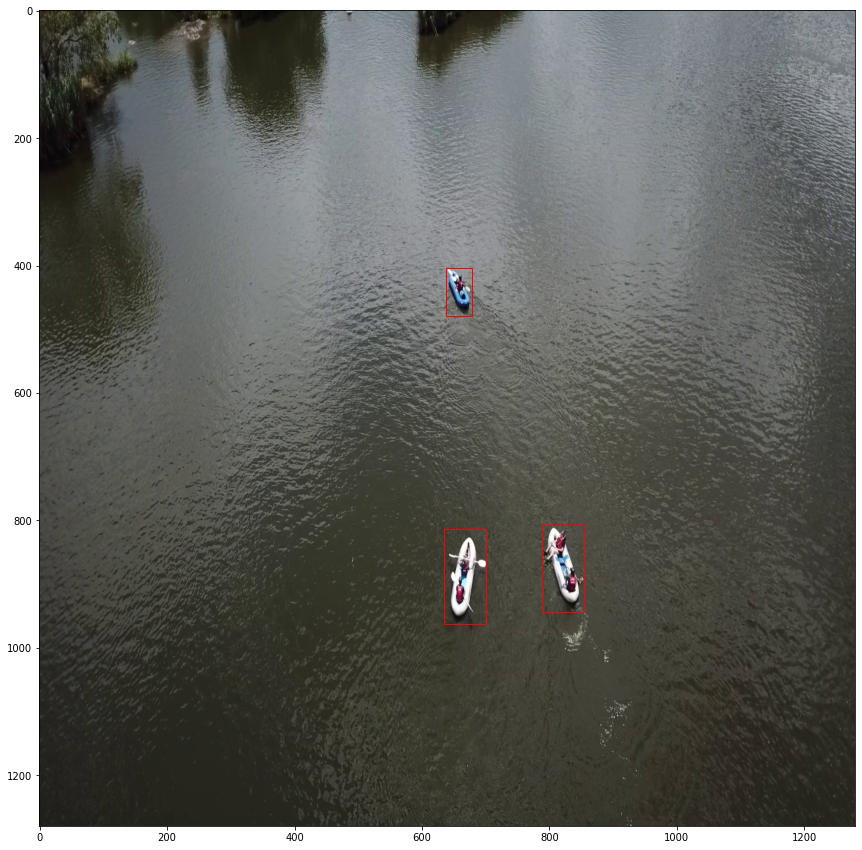

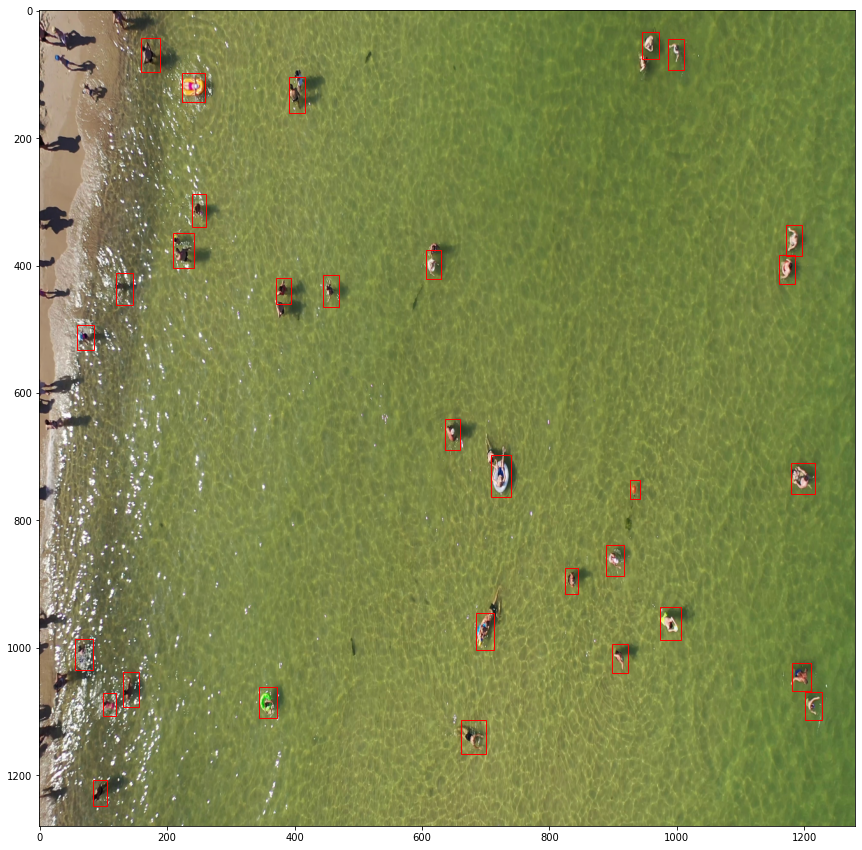

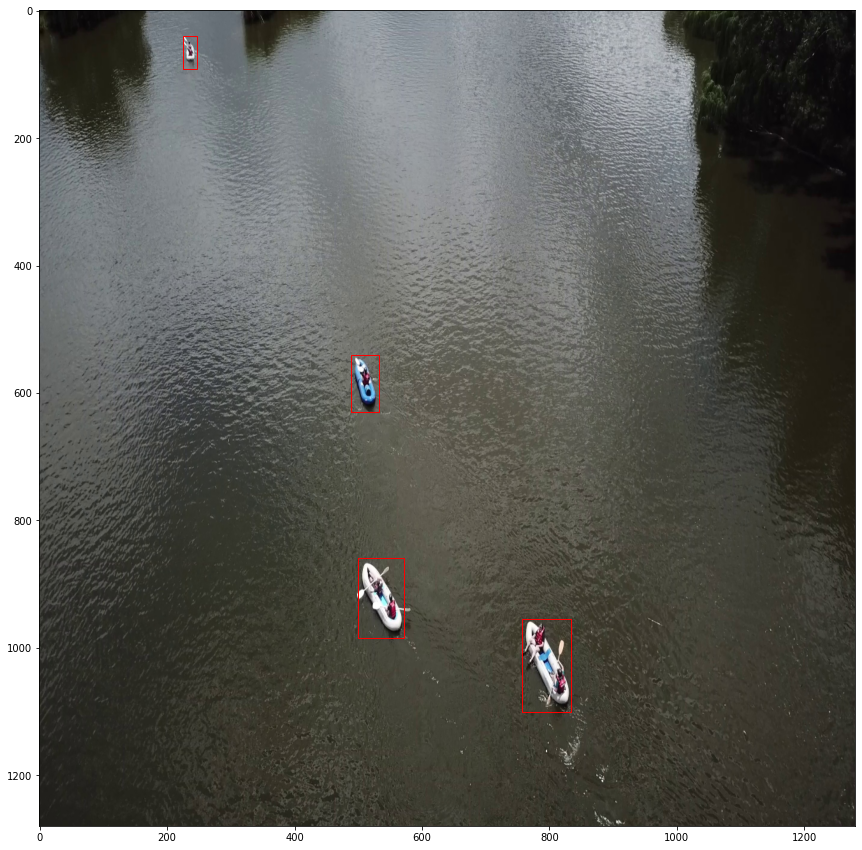

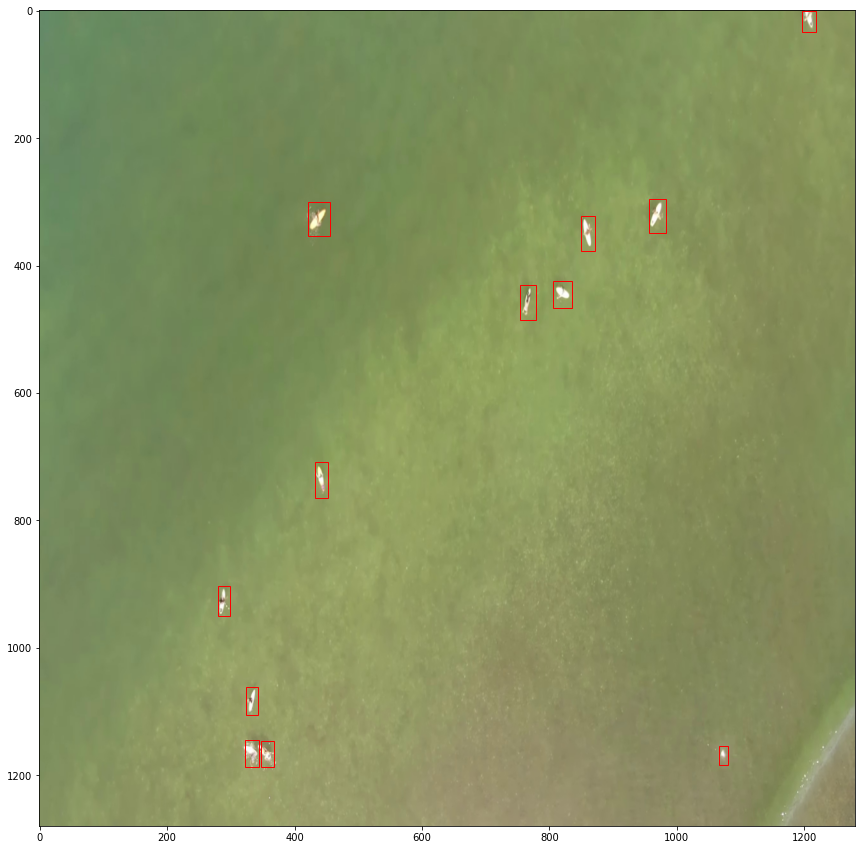

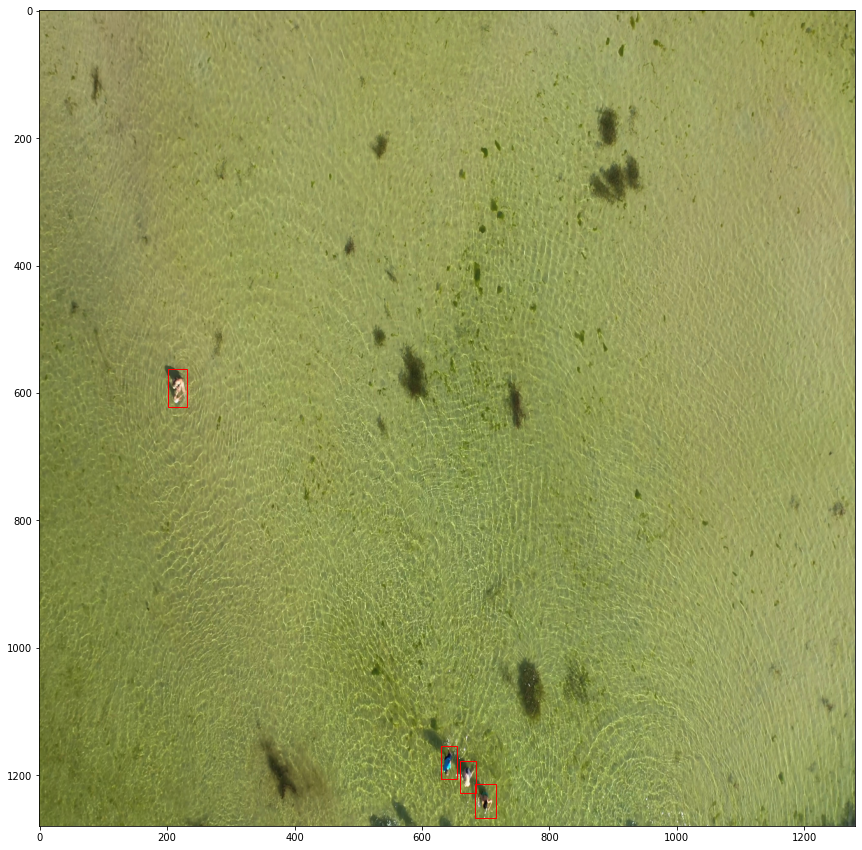

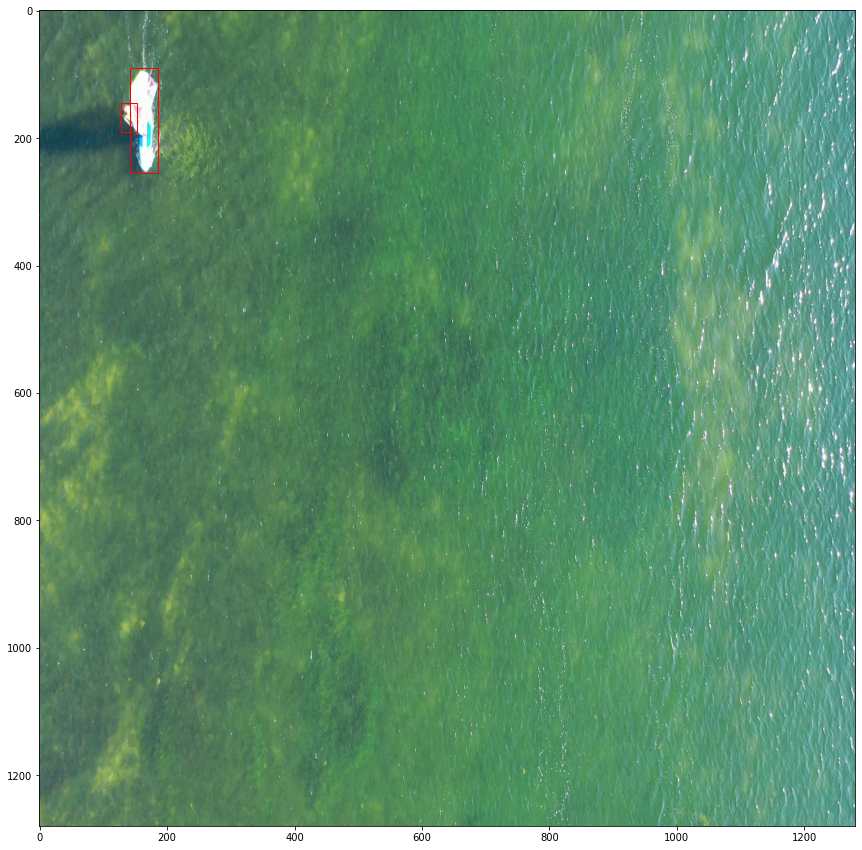

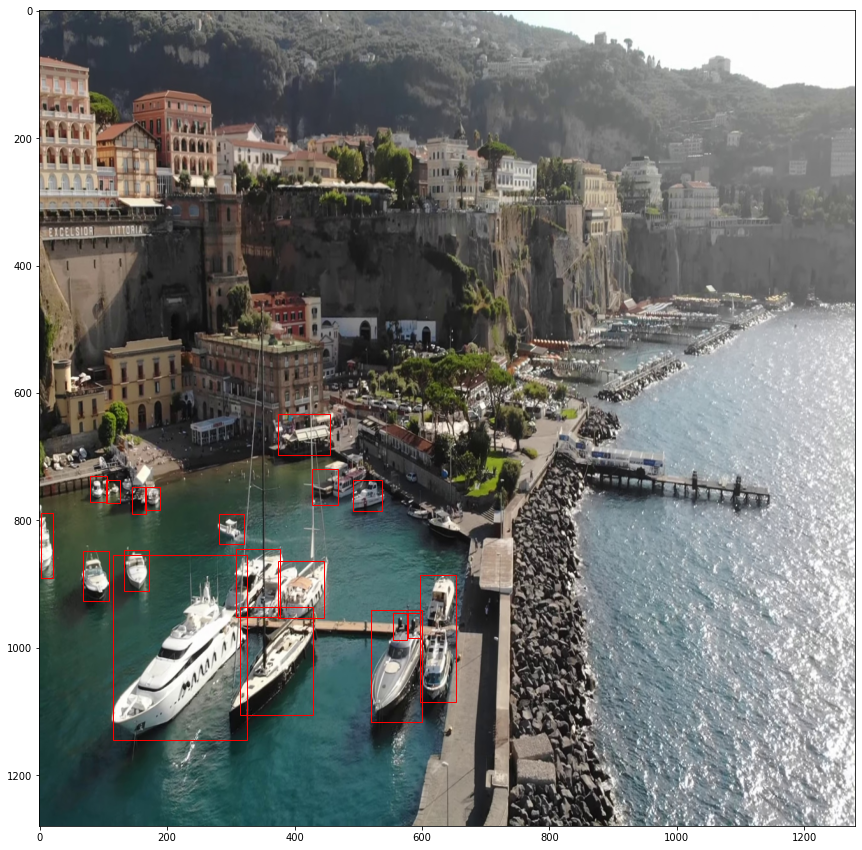

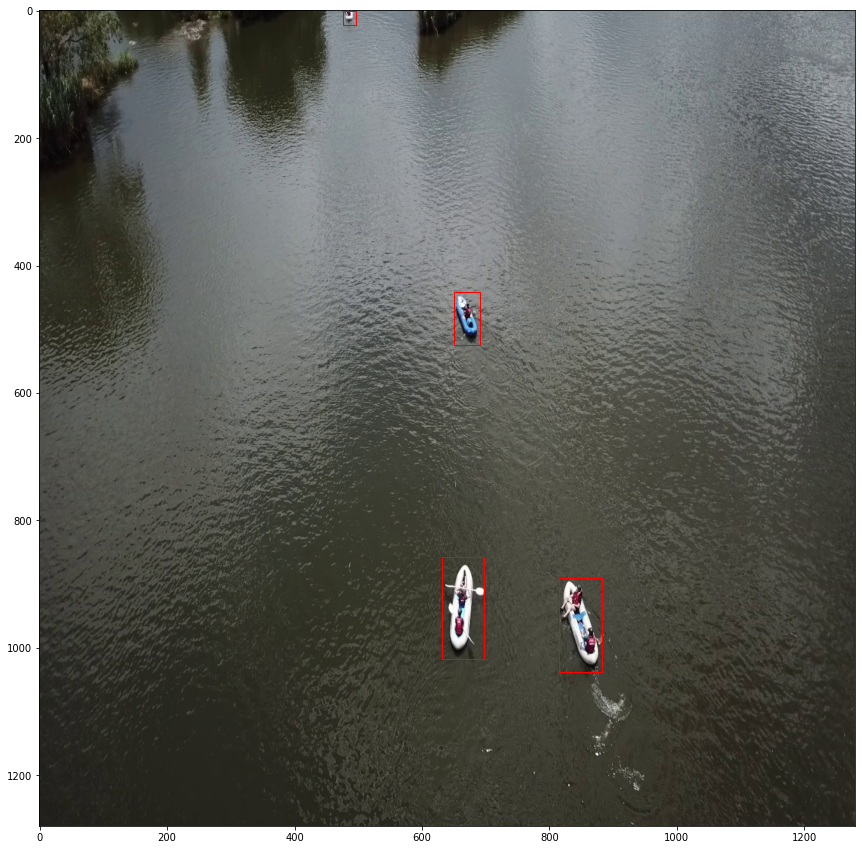

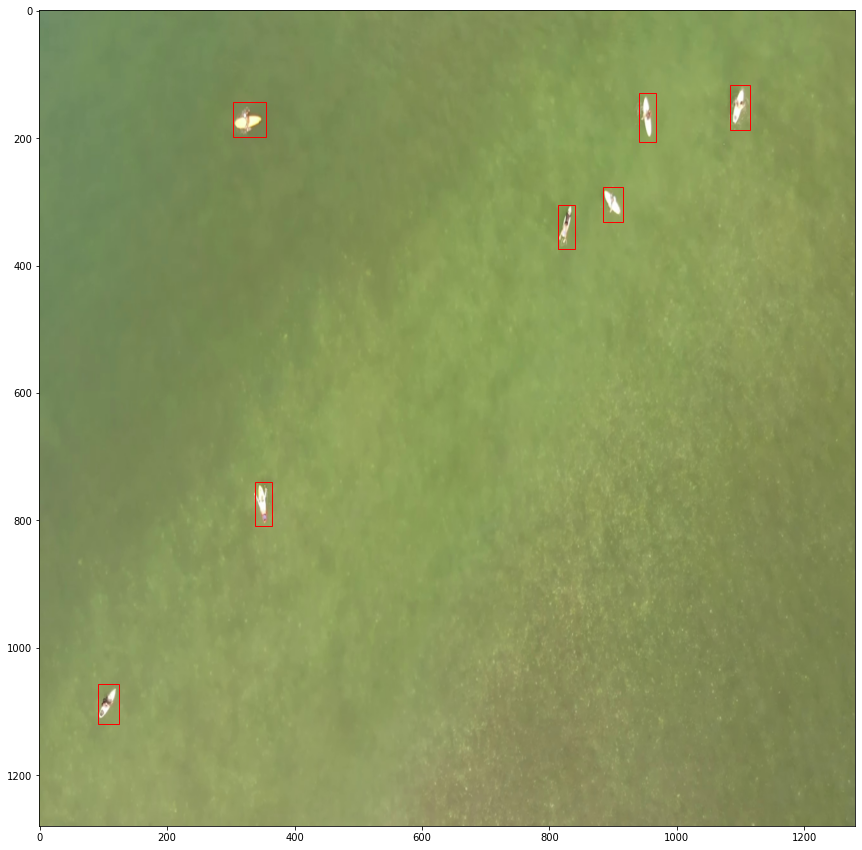

In [32]:
device = torch.device("cuda")
# device = torch.device("cpu")
model= get_model(2)
model.to(device)
model.load_state_dict(torch.load("/content/drive/MyDrive/FasterRCNN_SmallOD/backup/best_model.pth", map_location=torch.device('cuda')))

model.eval()

for i in range(9):
  img, target = dataset_test[i]

  with torch.no_grad():
    prediction = model([img.to(device)])[0]
    # print(model([img.to(device)]))


  # print("Predicted #boxes: ", len(prediction['labels']))
  # print('Real #boxes: ', len(target['labels']))

  nms_prediction = apply_nms(prediction, iou_thresh=0.1)

  # print("Predicted #boxes: ", len(nms_prediction['labels']))
  # print('Real #boxes: ', len(nms_prediction['labels']))

  image = img.numpy().transpose(1,2,0)
  boxes = nms_prediction["boxes"]
  labels = nms_prediction["labels"]
  # print(labels)
  fig, a = plt.subplots(1,1)
  fig.set_size_inches(15,15)
  a.imshow(image)
  for box in boxes:
    x_min = box[0].item()
    y_min = box[1].item()
    x_max = box[2].item()
    y_max = box[3].item()
    width = x_max - x_min
    height = y_max - y_min
    rectangle = patches.Rectangle((x_min,y_min), width, height,
                                    edgecolor="r", facecolor="none")
    
    a.add_patch(rectangle)
plt.show()